In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import os
import json
tfk  = tf .keras
tfkl = tfk.layers

from utils import *
from tf_dataset_load_custom import image_dataset_from_directory
from tqdm import tqdm

In [2]:
width  = 299
height = 299
batch_size = 32
dataset = image_dataset_from_directory(
    '/media/big/imagenet/data/ILSVRC/Annotations/CLS-LOC/train', # Change as necessary
    '/media/big/imagenet/data/ILSVRC/Data/CLS-LOC/train-bbox',   # Change as necessary
    batch_size = batch_size,
    image_size = (width, height)
)

model = tf.keras.applications.InceptionV3()

Found 544546 files belonging to 1000 classes.
Found 544546 files belonging to 1000 classes.


2021-12-09 23:54:06.397335: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-09 23:54:06.401958: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-09 23:54:06.402363: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-09 23:54:06.403660: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

In [3]:
@tf.function
def grad_func(x, idx):
    with tf.GradientTape() as tape:
        tape.watch(x)
        pred = model(x)
        pred = pred[:, idx]
    return tape.gradient(pred, x)


def get_int_grad(baseline, steps = 100, batch_size = 5):
    assert steps % batch_size == 0
    
    def int_grad(x, baseline):
        grad     = tf.zeros_like(x)
        baseline = baseline[tf.newaxis]
        x        = x       [tf.newaxis]
        delta    = (baseline - x) / steps
        alpha    = tf.cast(
            tf.linspace(0, steps, steps)[:, tf.newaxis, tf.newaxis, tf.newaxis], 
            dtype = tf.float32
        )
        
        best   = tf.argmax(model(x), axis = 1)[0]
        inputs = (alpha * delta) + baseline
        
        for choice in tf.reshape(tf.range(steps), (-1, batch_size)):
            grad += tf.reduce_sum(grad_func(
                tf.gather(inputs, choice),
                best
            ), 0)
        return grad
    
    def out_func(xs):
        xs = tf.map_fn(lambda x: int_grad(x, baseline), xs)
        return xs
    
    return out_func

2021-12-09 23:54:10.404705: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8100
2021-12-09 23:54:10.579171: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


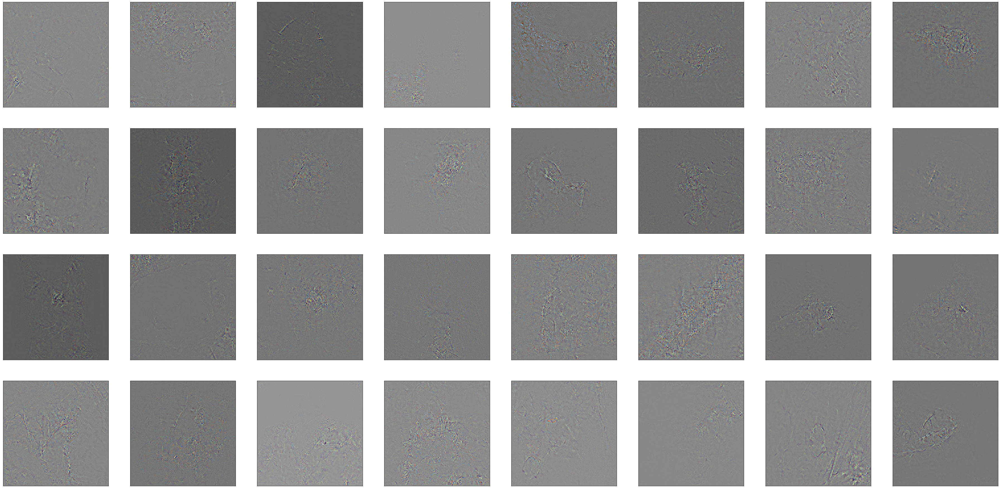

CPU times: user 28.1 s, sys: 2.19 s, total: 30.2 s
Wall time: 45.7 s


In [4]:
%%time

# Adjust for batch and step size in get_int_grad as desired
# Black baseline
# Higher step size is faster, but risk of GPU overflow (for some reason)
# For me IV3 is taking 7+ GB, which makes no sense
# Maybe you can figure that one out?
igf = get_int_grad(tf.zeros((299, 299, 3)) - 1)

rows = 4
cols = 8

plt.figure(figsize = (64, 32))
axes = [plt.subplot(rows, cols, idx + 1) for idx in range(rows * cols)]

for images, ys, bbox in dataset.map(preprocess_iv3).take(1):
    for im, y, xmin, xmax, ymin, ymax, ax in zip(
        igf(images), # Look here!
        # The idea was to use the function as dataset.map(igf)
        # However, this only runs on CPU (which isn't really an option)
        ys, *bbox, axes):
        ax.imshow(
            to_unitrange(im.numpy()),
            interpolation = 'none'
        )
        ax.set_xticks([])
        ax.set_yticks([])
plt.show()

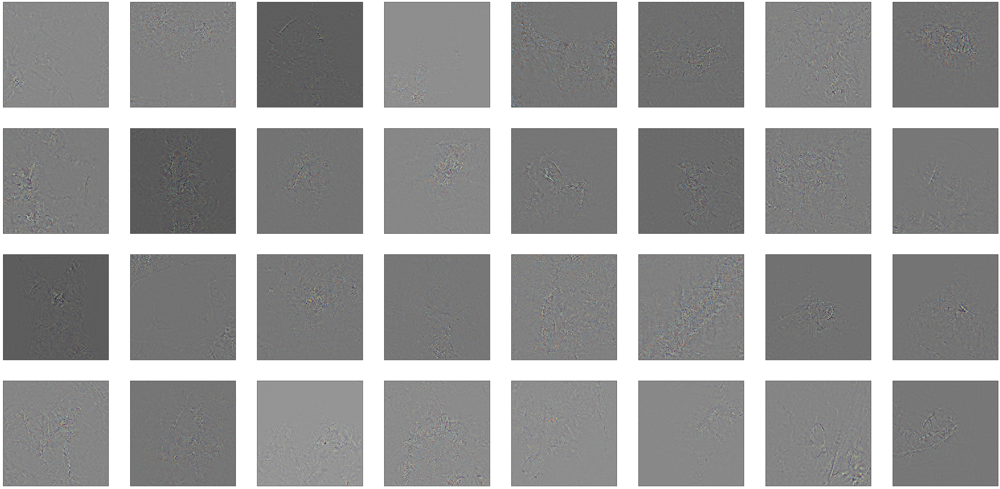

In [5]:
class IGMAP(tfkl.Layer):
    def __init__(self, igf):
        super().__init__()
        self.igf = igf
        
    def call(self, inputs):
        return self.igf(inputs)
    
input_layer = tfkl.Input(images.shape[1:])
ig_layer    = IGMAP(igf)(input_layer)
model_      = tfk.Model(input_layer, ig_layer)

res = model_(images)

rows = 4
cols = 8

plt.figure(figsize = (64, 32))
axes = [plt.subplot(rows, cols, idx + 1) for idx in range(rows * cols)]

for im, ax in zip(res, axes):
    ax.imshow(
        to_unitrange(im.numpy()),
        interpolation = 'none'
    )
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()